# Excercise:

## Ans.9

In [1]:
from sklearn.datasets import fetch_openml

In [2]:
mnist = fetch_openml('mnist_784', version=1, cache=True)

In [3]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier

In [4]:
X = mnist["data"]
y = mnist["target"]
X_train, y_train, X_test, y_test = X[:60000], y[:60000], X[60000:], y[60000:]

In [14]:
pca = PCA(n_components=0.95)
x_pca = pca.fit_transform(X_train)
x_pca.shape

(60000, 154)

In [17]:
rnd_clf = RandomForestClassifier()

In [18]:
rnd_clf.fit(x_pca, y_train)

RandomForestClassifier()

In [20]:
predictions = rnd_clf.predict(pca.transform(X_test))

In [21]:
from sklearn.metrics import accuracy_score

In [22]:
accuracy = accuracy_score(y_test, predictions)
accuracy

0.9479

## Ans.10

In [23]:
from sklearn.manifold import TSNE

In [24]:
tsne = TSNE(n_components=2)

In [25]:
tsne_x = tsne.fit_transform(X_train)

In [47]:
tsne_x

array([[ 31.253195,  19.533447],
       [-21.355381,  30.486008],
       [-32.731354,  17.615541],
       ...,
       [ 30.848757,  17.336933],
       [ 31.048218,  43.664093],
       [ 23.897709, -13.276578]], dtype=float32)

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd 

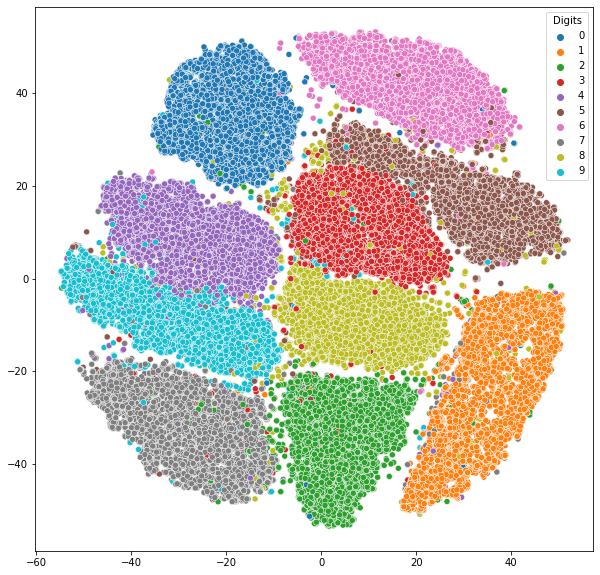

In [56]:
fig, axs = plt.subplots(figsize=(10, 10))
fig.set_facecolor('white')

sns.scatterplot(x=tsne_x[:, 0], y=tsne_x[:, 1], hue=y_train, hue_order=sorted(np.unique(y_train)))
axs.legend(title='Digits');

In [57]:
from sklearn.manifold import LocallyLinearEmbedding, MDS

In [59]:
lle = LocallyLinearEmbedding(n_components=2)
mds = MDS(n_components=2)
pca_2 = PCA(n_components=2)

In [60]:
lle_x = lle.fit_transform(X_train)

In [ ]:
mds_x = mds.fit_transform(X_train)

In [ ]:
pca_x_2 = pca_x_2.fit_transform(X_train)

In [ ]:
fig, axs = plt.subplots(figsize=(20, 20), nrows=2, ncols=2)
fig.set_facecolor('white')

n_axis = np.arange(2)
axis_set = np.array(zip(np.sort(np.array(np.repeat(n_axis, 2))), np.array(np.repeat(n_axis, 2))))
data_group = zip(('t-SNE', 'PCA', 'LLE', 'MDS'), (tsne_x, pca_x_2, lle_x, mds_x), axis_set)

for group_name, data, ax in data_group:
    row, col = ax
    sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=y_train, hue_order=sorted(np.unique(y_train)), axs=axs[row, col])
    axs[row, col].legend(title='Digits')
    axs[row, col].Title(group_name)

plt.show();